# Hydrological modelling at hyper-resolution (< 1km): 

## Simulating human influences on the hydrological cycle

In [1]:
from netCDF4 import Dataset, num2date
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from PIL import Image
import datetime

In [2]:
#fuse_folder = 'C:/FUSE'
fuse_folder_github = 'C:/FUSE'
fuse_folder_local = 'C:/FUSE'

#cwatm_folder_local = 'C:/CWatM_output'

output_folder = 'C:/CWatM_output'
photo_folder = fuse_folder_github + '/Images'

#This is in the CWatM Output folder
simulated_discharge = output_folder + '/discharge_daily.nc'

## Introduction

What influences on the water cycle become important to represent explicitly at higher resolutions?

The answer depends significantly on the environmental, economic, and sociopolitical context of the region of interest, as well as the resolution. Here, we present and showcase developments to the CWAtM hydrological mdoel to better simulate the hydrological cycle for a highly-managed basin at hyper-resolution (<1 km). 

The Upper Bhima basin in western India is a highly-managed basin of sufficient complexity. It hosts the rapidly growing cities of Pune and Solapur, a monsoonal climate, and an increasing competition for resources. It has significant agriculture irrigated with hundreds of reservoirs, canal networks delivering water up to a hundred kilmetres away, and significant groundwater abstraction. 

At hyper resolution, local water demand is necessarily satisfied and interacts with the water availability of other cells. The developments discussed herein relate to modeling the devliery of surface and groundwater to satisfy demands.

The Community Water Model (CWatM) is an open-source process-based hydrological model. A region is simulated as a connected grid of cells where the water fluxes within and between cells are calculated at a daily timestep. Cells in CWatM concerning surface water have a width of 0.0083 degrees (~850 m), and cells concerning groundwater have a width of 500 m.




 are separated will be satisfied with water availability from upstream 
 
 the several processes that were previously to some degree absorbed into the lower resolution become necessary to simulate. 
 
  However, when reservoir storage and rivers allocated to satisfying this demand are located away from the demand itself, water . 
 
However, These include the , and groundwater dynamics. We present several developments to the open-source hydrological model CWatM developed at IIASA, showcased on a highly-managed basin  with sufficient complexity, namely the Upper Bhima basin in western India.

## CWatM: The Community Water Model
### An Open-source hydrological model developed at IIASA



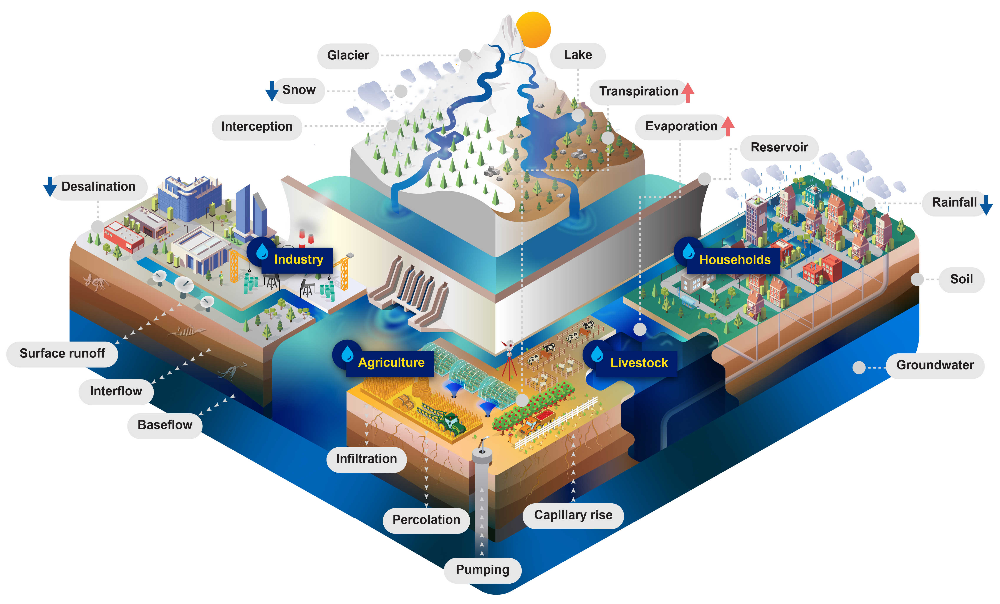

In [3]:
img = Image.open(photo_folder + '/CWatM_schematic.jpg')
img




one must simulate the devlvery of water from reservoirs over their command area. delivering water between distant cells. water for cells to deliver water to cells not necessarily downstream . not necessarily touching to deliver water from one another to simulate the water used to satisfy local cell-specific human-related water demands is generally not restricted to the the locality itself. This is both because water is now delivered from upstream reservoirs located potentially several cells  away, and thatlocal groundwater pumping can affect grouundwater avaialbility and levels away from it..  delivered from local irrigation, industry, and domestic water demands can not longer be approrpiately assumed to be met from water within the local cell itself, as the cells themselves don't contain the reservoirs or canals from which the non-local water is deliveered. . This becomes increasingly less  although less so towards higher resolutions. Water delivery from reservoirs At hyper-resolution, water from

The Nira basin is a sub-basin of the the Upper Bhima basin in Western Peninsular India, itself the northwestern corrner of the Krisna basin, and relatively entirely within the State of Maharashtra. This basin is being presesnted as an example case study to showcase the model developments discussed herein.

CWatM is a hydrological model 




These developments are inspired in part by the FUSE project: https://fuse.stanford.edu/

The model development highlights inlclude:
1. Simuating water distribution/delivery from reservoirs to their command areas 
2. Simulating canal leakage, into the aquifer
3. Region-specific reservoir operations
 . Shutting off reservoir discharge downstream in certain periods
 . Individual Reservoir-specific operations
 . More annual variation, and allowing for emptying.
4. Groundwater pumping and levels
 . Local groundwater demand abstracted within cell 
4. Crop-specific water use and relative yields

To showcase the developments, we will focus on a sub-basin of the Upper Bhima basin with sufficient complexity The Nira sub-basin  contains:
 - 4 reservoirs: 
     - 3 releasing into the river downstream, and 
     - 1 releasing over a command area with canal leakge
 - many lakes
 - 16 eco-political regions 
 

This notebook presents the water balance for the Nira river sub-basin of the Upper Bhima basin.

These are the results of CWatM simulations:
 - https://cwatm.iiasa.ac.at/
 - https://github.com/CWatM/CWatM

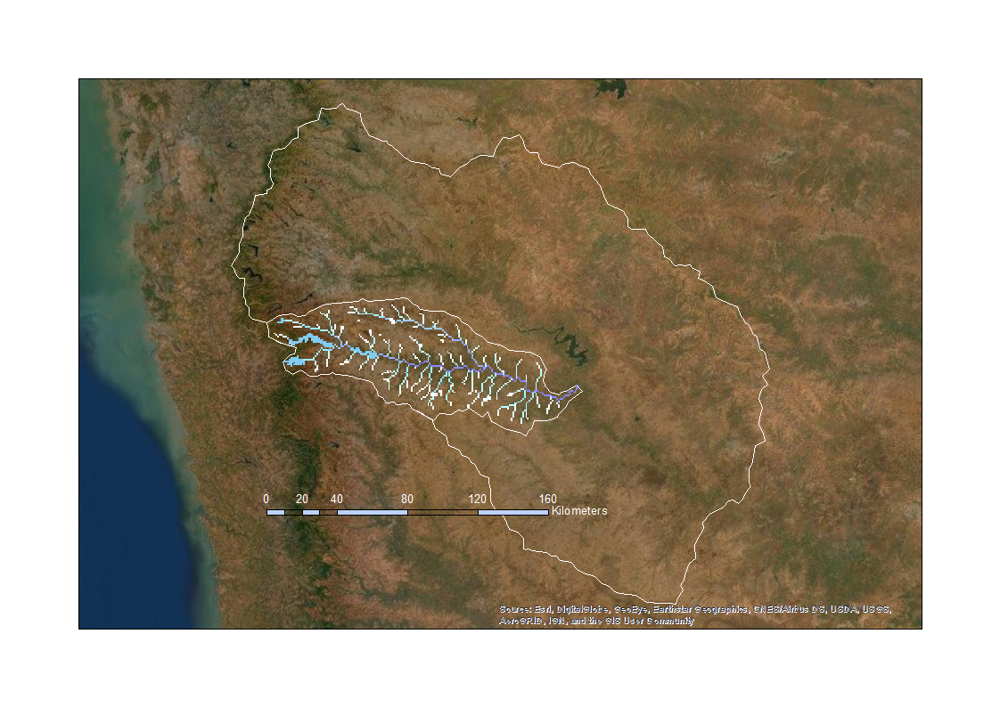

In [4]:
img = Image.open(photo_folder + '/Sarati_in_UB.tif')
img

Figure 1 The Nira river sub-basin: Rivers, Lakes, and Reservoirs and highlighted in shades of Blue and White. The sub-basin is ~160 km long. Noteworthy to those more familiar with the region is the Ujjani reservoir, discharging near the outlet of the Nira river sub-basin. 

 # Data
 
  The data contain reservoir operations for 3/4 reservoirs each for different periods of around 5 years, and contain river discharge points for 4 locations for different periods of between 10 and 30 years

## Spatial Unit: Segments

The smallest administrative unit with available data for the region is called the Taluka. Here, the Taluka is further divided into that within and that outside of the Veer comand area.

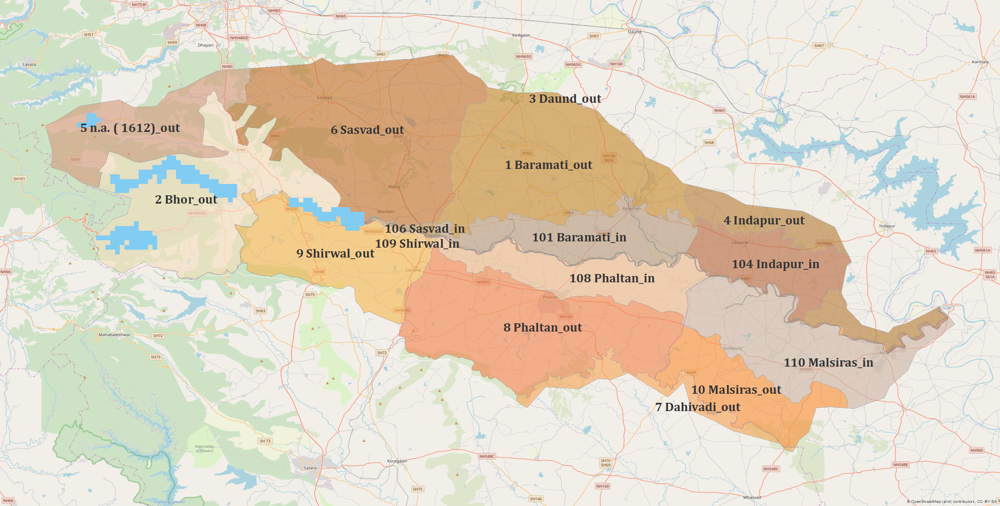

In [5]:
img = Image.open(photo_folder + '/admin_segments_Sarati.tif')
img

In [6]:
admin_segments_file = output_folder + "/adminSegments_daily.nc"
nc_admin_segments = Dataset(admin_segments_file, 'r')
admin_segments = nc_admin_segments.variables['adminSegments'][0,:,:]

In [7]:
Segment_reps = []

for i in range(nc_admin_segments.variables['lat'].shape[0]):
    for j in range (nc_admin_segments.variables['lon'].shape[0]):
        
        if admin_segments[i,j]>0 and admin_segments[i,j] not in [i[0] for i in Segment_reps]:       
            Segment_reps.append([int(admin_segments[i,j]), i, j])

Segment_reps.sort()

In [8]:
def geo_idx(dd, dd_array):
   """
     search for nearest decimal degree in an array of decimal degrees and return the index.
     np.argmin returns the indices of minium value along an axis.
     so subtract dd from all values in dd_array, take absolute value and find index of minium.
    """
   geo_idx = (np.abs(dd_array - dd)).argmin()
   return geo_idx

In [9]:
Discharge_Sarati = [('Nira outlet', 17.97, 75.12)]

nc_simulated = Dataset(output_folder + '/discharge_monthtot.nc', 'r')
times = nc_simulated.variables['time'][:]

Dates_simulated = [datetime.datetime(1900,1,1)+datetime.timedelta(seconds = 365.25/12*24.0*3600.0*float(val)) for val in times]

FLOWS_simulated = []

lats = nc_simulated.variables['lat'][:]
lons = nc_simulated.variables['lon'][:]

for discharge_location in Discharge_Sarati:
    in_lat = discharge_location[1]
    in_lon = discharge_location[2]
    
    lat_idx = geo_idx(in_lat, lats)
    lon_idx = geo_idx(in_lon, lons)
    
    FLOWS_simulated.append(nc_simulated.variables['discharge_monthtot'][:, lat_idx, lon_idx])
    

## Nira sub-basin outflow

Here, we present the monthly discharge at the outlet of the Nira subbasin.

In [10]:
for i in range(len(Discharge_Sarati)):

    fig = go.Figure()

    fig.add_trace(go.Scatter(y=FLOWS_simulated[i],
                             x=Dates_simulated,
                    mode='lines',
                    name='Simulated'))


    fig.update_layout(title='Discharge: '+ Discharge_Sarati[i][0],
                           xaxis_title = 'Months',
                           yaxis_title = 'Discharge (m3/s)')

    fig.show()

In [11]:
ETRef_monAvg_segments_file = output_folder + "/totalETM3_segments_monthtot.nc"
rain_monAvg_segments_file = output_folder + "/rainM3_segments_monthtot.nc"
act_nonIrrConsumption_segments_file = output_folder + "/act_nonIrrConsumption_segments_monthtot.nc"
act_totalIrrConsumption_segments_file = output_folder + "/act_totalIrrConsumption_segments_monthtot.nc"
totalSto_segments_file = output_folder + '/totalSto_segments_monthend.nc'

nc_ETRef_monAvg_segments = Dataset(ETRef_monAvg_segments_file, 'r')
nc_rain_monAvg_segments = Dataset(rain_monAvg_segments_file, 'r')
nc_act_nonIrrConsumption_segments = Dataset(act_nonIrrConsumption_segments_file, 'r')
nc_act_totalIrrConsumption_segments = Dataset(act_totalIrrConsumption_segments_file, 'r')
nc_totalSto_segments = Dataset(totalSto_segments_file, 'r')

ETRef_monAvg_segments = nc_ETRef_monAvg_segments.variables['totalETM3_segments_monthtot'][:,:,:]
rain_monAvg_segments = nc_rain_monAvg_segments.variables['rainM3_segments_monthtot'][:,:,:]
act_nonIrrConsumption_segments = nc_act_nonIrrConsumption_segments.variables['act_nonIrrConsumption_segments_monthtot'][:,:,:]
act_totalIrrConsumption_segments = nc_act_totalIrrConsumption_segments.variables['act_totalIrrConsumption_segments_monthtot'][:,:,:]
totalSto_segments = nc_totalSto_segments.variables['totalSto_segments_monthend'][:,:,:]

sum_runoff_segments_file = output_folder + "/sum_runoff_segments_monthend.nc"
nc_sum_runoff_segments = Dataset(sum_runoff_segments_file, 'r')
sum_runoff_segments = nc_sum_runoff_segments.variables['sum_runoff_segments_monthend'][:,:,:]


In [12]:
ETRef_monAvg_representative = []
rain_monAvg_representative= []
act_nonIrrConsumption_representative = []
act_totalIrrConsumption_representative =[]
sum_runoff_representative = []
totalSto_representative = []

print(len(Segment_reps))

for seg in Segment_reps:
    
    ETRef_monAvg_representative.append([seg[0]])
    rain_monAvg_representative.append([seg[0]])
    act_nonIrrConsumption_representative.append([seg[0]])
    act_totalIrrConsumption_representative.append([seg[0]])
    totalSto_representative.append([seg[0]])
    sum_runoff_representative.append([seg[0]])
    
    #print(nc_ETRef_monAvg_segments.variables['time'].shape[0])
    
    for t in range(nc_ETRef_monAvg_segments.variables['time'].shape[0]):
        ETRef_monAvg_representative[-1].append(ETRef_monAvg_segments[t, seg[1], seg[2]])
        rain_monAvg_representative[-1].append(rain_monAvg_segments[t, seg[1], seg[2]])
        act_nonIrrConsumption_representative[-1].append(act_nonIrrConsumption_segments[t, seg[1], seg[2]])
        act_totalIrrConsumption_representative[-1].append(act_totalIrrConsumption_segments[t, seg[1], seg[2]])
        totalSto_representative[-1].append(totalSto_segments[t, seg[1], seg[2]])
        sum_runoff_representative[-1].append(sum_runoff_segments[t, seg[1], seg[2]])

16


In [13]:
### import plotly.graph_objects as go
x = Dates_simulated

fig = go.Figure()
fig2 = go.Figure()


Y = [0]*len(totalSto_representative[0][1:])

for i in totalSto_representative:
    
    y = np.array(i[1:])
    Y += y
    
    fig.add_trace(go.Bar(x=x, y=y,
                    name = 's'+ str(i[0]) +'Storage'))

Y_SoilStorage = Y
fig2.add_trace(go.Bar(x=x, y=Y_SoilStorage,
                    name = 'Storage'))

## Evapotranspiration

Here, we present monthly- and segment-specific total evapotranspiration.

for i in range(len(ETRef_monAvg_representative)):
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=ETRef_monAvg_representative[i][1:],
                             x=Dates_simulated,
                    mode='lines',
                    name=ETRef_monAvg_representative[i][0]))
    
    fig.add_trace(go.Scatter(y=act_totalIrrConsumption_representative[i][1:],
                             x=Dates_simulated,
                    mode='lines',
                    name=act_totalIrrConsumption_representative[i][0]))


    fig.update_layout(title='Evapotranspiration, totaled over segment and month',
                       xaxis_title='Month',
                       yaxis_title='Monthly Average Reference ET (m3)')

    fig.show()

In [14]:
fig = go.Figure()

for i in ETRef_monAvg_representative:
    fig.add_trace(go.Scatter(y=i[1:],
                             x=Dates_simulated,
                    mode='lines',
                    name=i[0]))


fig.update_layout(title='Evapotranspiration, totaled over segment and month',
                       xaxis_title='Month',
                       yaxis_title='Monthly Average Reference ET (m3)')

fig.show()

## Rainfall

Here, we present the monthly- and segment-specific total rainfall.

In [15]:
nc_GWStorage = Dataset(output_folder + '/modflowStorGW_monthend.nc', 'r')
nc_SWStorage = Dataset(output_folder + '/lakeResStorage_monthend.nc', 'r')

In [16]:
times = nc_GWStorage.variables['time'][:]
Dates_simulated_gw = [datetime.datetime(1901,1,1)+datetime.timedelta(days = float(val)) for val in times]


In [17]:
Storage = nc_SWStorage.variables['lakeResStorage_monthend'][1,:,:]
reservoirs = []

for i in range(nc_SWStorage.variables['lat'].shape[0]):
    for j in range (nc_SWStorage.variables['lon'].shape[0]):
        if Storage[i,j] > 0:
            
            reservoirs.append([Storage[i,j], i, j])
            
print(reservoirs)

[[95913270.0, 143, 55], [4459.6675, 143, 100], [365868.28, 143, 122], [23316.701, 148, 90], [16334.351, 150, 108], [2.0655115, 152, 114], [0.038325284, 155, 152], [26773.658, 156, 106], [593430800.0, 159, 84], [34416.305, 159, 108], [6.614512, 159, 138], [224475410.0, 164, 111], [110501384.0, 168, 66], [28799.877, 168, 92], [29522.52, 168, 94], [23395.232, 169, 93], [48705.074, 173, 74], [8072.7515, 175, 118], [11944.551, 179, 119], [5713.759, 183, 157], [936.3375, 186, 126], [0.024076521, 186, 150], [0.806948, 187, 169], [0.0058972407, 187, 172], [32295.51, 188, 146], [0.005499092, 188, 151], [53851.484, 188, 194], [0.007502388, 189, 148], [2.5943055, 190, 173], [1.0076884, 190, 180], [10.384023, 192, 178], [44.537643, 195, 168], [17607.145, 197, 216]]


In [18]:
Gw_Storage = []
for i in range(len(nc_GWStorage.variables['time'][:])):
    Gw_Storage.append(sum(sum(nc_GWStorage.variables['modflowStorGW_monthend'][i,:,:])))
    
Sw_Storage = []
for i in range(len(nc_SWStorage.variables['time'][:])):
    
    sum_storage = []
    for res in reservoirs:
        sum_storage.append(nc_SWStorage.variables['lakeResStorage_monthend'][i,res[1],res[2]])
        
    Sw_Storage.append(sum(sum_storage))
        

In [19]:
Gw_Storage = np.array(Gw_Storage)
Gw_Storage *= 500**2

In [20]:
fig = go.Figure()
    
for i in rain_monAvg_representative:
    fig.add_trace(go.Scatter(y=i[1:],
                             x=Dates_simulated,
                    mode='lines',
                    name=i[0]))


fig.update_layout(title='Rainfall, totaled over segment and month',
                       xaxis_title='Month',
                       yaxis_title='Monthly Rainfall (m3)')

fig.show()

 # Surface water

In [21]:
fig = go.Figure()

fig.add_trace(go.Scatter(y=Sw_Storage,
                         x=Dates_simulated_gw,
                mode='lines',
                name='Simulated'))


fig.update_layout(title='Surface water storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')

fig.show()

####

fig2 = go.Figure()

Y = [0]
for i in range(len(Sw_Storage[1:])):
    Y.append(Sw_Storage[i+1]-Sw_Storage[i])
    
Sw_Storage_change = -1*np.array(Y)

fig2.add_trace(go.Bar(x=Dates_simulated_gw, y=Y,
                    name = 'Groundwater storage change'))

fig2.update_layout(title='Change in Surface water storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')

## Groundwater

Here, we present the monthly total groundwater storage and change in storage.

In [22]:
fig = go.Figure()

fig.add_trace(go.Scatter(y=Gw_Storage,
                         x=Dates_simulated_gw,
                mode='lines',
                name='Simulated'))


fig.update_layout(title='Groundwater storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')



fig.show()

####

fig2 = go.Figure()

Y = [0]
for i in range(len(Gw_Storage[1:])):
    Y.append(Gw_Storage[i+1]-Gw_Storage[i])
    
Gw_Storage_change = -1*np.array(Y)

fig2.add_trace(go.Bar(x=Dates_simulated_gw, y=Y,
                    name = 'Groundwater storage change'))

fig2.update_layout(title='Change in Groundwater storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')

## Soil storage

Here, we present the monthly total soil water storage and change in storage.

In [23]:


fig = go.Figure()

fig.add_trace(go.Scatter(y=Y_SoilStorage,
                         x=Dates_simulated_gw,
                mode='lines',
                name='Simulated'))


fig.update_layout(title='Soil storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')

fig.show()

####

fig2 = go.Figure()

Y = [0]
for i in range(len(Y_SoilStorage[1:])):
    Y.append(Y_SoilStorage[i+1]-Y_SoilStorage[i])
    
Soil_Storage_change = -1*np.array(Y)

fig2.add_trace(go.Bar(x=Dates_simulated_gw, y=Y,
                    name = 'Groundwater storage change'))

fig2.update_layout(title='Change in Soil storage',
                       xaxis_title = 'Months',
                       yaxis_title = 'm3')

## Water balance

Here, we present the monthly- and segment-specific Rainfall - Evapotranspiration - Discharge - change in Groundwater storage

In [24]:
### import plotly.graph_objects as go
x = Dates_simulated

fig = go.Figure()
fig2 = go.Figure()


Y = [0]*len(rain_monAvg_representative[0][1:])

for i in rain_monAvg_representative:
    
    y = np.array(i[1:])
    Y += y
    
    fig.add_trace(go.Bar(x=x, y=y,
                    name = 's'+ str(i[0]) +'Rainfall'))

Y_rain = Y
fig2.add_trace(go.Bar(x=x, y=Y,
                    name = 'Rainfall'))

###

Y = [0]*len(rain_monAvg_representative[0][1:])
for i in ETRef_monAvg_representative:
    
    y = -np.array(i[1:])
    Y += y
    
    fig.add_trace(go.Bar(x=x, y=y,
                         name = 's'+ str(i[0]) +' Evapotranspiration'))
Y_ET = Y    
fig2.add_trace(go.Bar(x=x, y=Y,
                    name = 'Evapotranspiration'))

###

Y = [0]*len(rain_monAvg_representative[0][1:])
for i in act_nonIrrConsumption_representative:
    
    y = -np.array(i[1:])
    Y += y
    
    fig.add_trace(go.Bar(x=x, y=y,
                         name = 's'+ str(i[0]) +' act_nonIrrConsumption'))
Y_nonIrrConsumption = Y    
fig2.add_trace(go.Bar(x=x, y=Y,
                    name = 'act_nonIrrConsumption'))

###
"""
Y = [0]*len(rain_monAvg_representative[0][1:])
for i in act_totalIrrConsumption_representative:
    
    y = -np.array(i[1:])
    Y += y
    
    fig.add_trace(go.Bar(x=x, y=y,
                         name = 's'+ str(i[0]) +' act_totalIrrConsumption'))
Y_ET = Y    
fig2.add_trace(go.Bar(x=x, y=Y,
                    name = 'act_totalIrrConsumption'))
"""

###

y = -1*60*60*24*np.array(FLOWS_simulated[0])
Y_FLOWS = y

fig.add_trace(go.Bar(x=x, y=y,
                    name = 'Discharge'))

fig2.add_trace(go.Bar(x=x, y=Sw_Storage_change,
                    name = 'Surface water storage change'))

fig.add_trace(go.Bar(x=x, y=Gw_Storage_change,
                    name = 'Groundwater storage change'))


fig2.add_trace(go.Bar(x=x, y=Gw_Storage_change,
                    name = 'Groundwater storage change'))


fig2.add_trace(go.Bar(x=x, y=Soil_Storage_change,
                    name = 'Soil storage change'))


fig2.add_trace(go.Bar(x=x, y=y,
                    name = 'Discharge'))



fig.update_layout(barmode='relative', title_text='Water balance, segment and month-specific')

fig2.update_layout(barmode='relative', title_text='Water balance, Nira-basin, month-specific')

fig2.show()
#fig.show()



In [25]:
WB_yearly = [] #[Dates_simulated[[0].year] # from April to March

for i in range(len(Dates_simulated)):
    
    monthCounter = Dates_simulated[i].month
    
    if monthCounter == 4:
        
        WB_yearly.append([Dates_simulated[i].year,[0,0,0,0,0,0]])
        WB_yearly[-1][1][0] += Y_rain[i]/1000000
        WB_yearly[-1][1][1] += Y_ET[i]/1000000
        WB_yearly[-1][1][2] += Y_FLOWS[i]/1000000
        WB_yearly[-1][1][3] += Gw_Storage_change[i]/1000000
        WB_yearly[-1][1][4] += Sw_Storage_change[i]/1000000
        WB_yearly[-1][1][5] += Soil_Storage_change[i]/1000000
        
    else:
        if WB_yearly != []:    
            WB_yearly[-1][1][0] += Y_rain[i]/1000000
            WB_yearly[-1][1][1] += Y_ET[i]/1000000
            WB_yearly[-1][1][2] += Y_FLOWS[i]/1000000
            WB_yearly[-1][1][3] += Gw_Storage_change[i]/1000000
            WB_yearly[-1][1][4] += Sw_Storage_change[i]/1000000
            WB_yearly[-1][1][5] += Soil_Storage_change[i]/1000000

print(WB_yearly)    
for i in WB_yearly:
    print('year: '+str(i[0]))
    
    balance = sum(i[1])

    missing = balance / sum([max(j,0) for j in i[1]])
    print("% missing: " +str(missing*100))
    


[[1996, [7109.384313046875, -5929.469023048828, -1530.636114633179, 1379.099667727951, 33.1559547283843, 227.94101015624994]], [1997, [8216.519533262688, -6210.84015652246, -989.4830148025991, 583.4742025732955, 24.894222932052827, -66.61344993750023]], [1998, [7160.455397712313, -6139.633362509765, -634.4265992641924, 801.979475557808, 18.103428690095356, 156.4391148437502]], [1999, [4484.427891326478, -4257.15360273584, -103.42188420332765, 207.9053077697754, 140.23266658831554, 127.72190271874993]], [2000, [4849.946671413086, -3809.736475875977, -99.9600040399346, 63.604679107666016, -192.46308954385813, -299.4260710937497]]]
year: 1996
% missing: 14.737572187581666
year: 1997
% missing: 17.654063652531267
year: 1998
% missing: 16.74967724766446
year: 1999
% missing: 12.090271965354027
year: 2000
% missing: 10.419463916113813
